# Matplotlib II

### 摘要: 传统画图方法

参考知乎文章《matplotlib: 先搞明白plt./ax./fig再画》

https://zhuanlan.zhihu.com/p/93423829

In [1]:
import numpy as np 
import matplotlib.pyplot as plt

In [2]:
#解决中文显示问题
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus'] = False

plt.xxx是matplotlib提供的一个api，通过它可以很快的画出图来

这里记录另一种画图方式，对画出的图更细致的精调

重新学习，避免混用

### 几个名词解释

Figure: 可以解释为画布

    fig = plt.figure(): 创建一个画布fig，然后在这个画布上添加各种元素

Axes: 可以解释为放到画布上的各种物体，例如画一个圆，一个椭圆，圆就是一个axes，椭圆也是一个axes

    ax = fig.add_subplot(1, 1, 1): 在画布上添加一个名为ax的axes对象

Axis: 可以解释为坐标轴

    ax.xaxis/ax.yaxis: x, y坐标轴

### 画图

In [3]:
#数据
x = np.linspace(-np.pi, np.pi, 500)
y = np.sin(x)

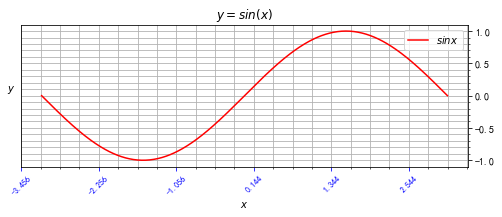

In [4]:
#创建画布，将画布赋值给fig
#同时在画布上创建一个axes对象，赋值给ax
#未来所有对画布进行的操作都是fig.***，对Axes对象进行的操作都是ax.***
"""
fig, ax = plt.subplots(nrow=2, ncols=1, sharex='col', figsize=(12, 8))
ax[0, 0].***
ax[1, 0].***
"""
#若创建了多个子图，即多个Axes对象，则ax是有多个元素的列表，即ax[i]对应第i张子图

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 3))
#画图
ax.plot(x, y, label='$sinx$', color='r')
#调坐标轴，标题
ax.set_title('$y = sin(x)$')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$', labelpad=10, rotation=0)    #labelpad 坐标轴包围框点间距
ax.legend()
#x, y坐标轴一些属性设定
ax.set_aspect(aspect='equal')
ax.minorticks_on()    #打开小刻度
ax.grid(which='both', axis='both')    # major: 大刻度网格图  minor: 小刻度网格图  both: 大小刻度都生成网格图
#坐标轴tick和细节
ax.xaxis.set_tick_params(rotation=45, labelsize=8, colors='b')    #设置刻度、刻度标签和网格线的外观参数
left, right = ax.get_xlim()    #获得x轴限制
ax.xaxis.set_ticks(np.arange(left, right, 1.2))    #设置此轴的刻度位置
ax.yaxis.tick_right()

同一图形界面中画出6条曲线

$$ y = kx^2sinx + 2k + cosx^3 \qquad k = 1, 2, \cdots, 6$$

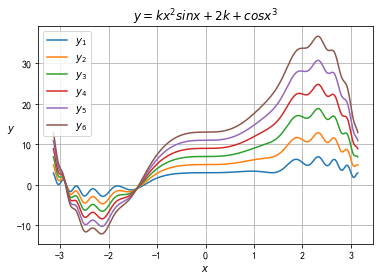

In [5]:
x = np.linspace(-np.pi, np.pi, 500)
fig, ax = plt.subplots()
#迭代生成6条曲线
for k in range(1, 7):
    y = k*x**2*np.sin(x)+2*k+np.cos(x**3)
    ax.plot(x, y, label='$y_{%d}$'%k)
#设置图片细节
ax.set_title('$y = kx^2sinx + 2k + cosx^3$')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$', rotation=0, labelpad=5)
ax.grid(axis='both')
ax.legend()
plt.show()

2行3列子窗口，每个子窗口画一条曲线

$$ y = kx^2sinx + 2k + cosx^3 \qquad k = 1, 2, \cdots, 6$$

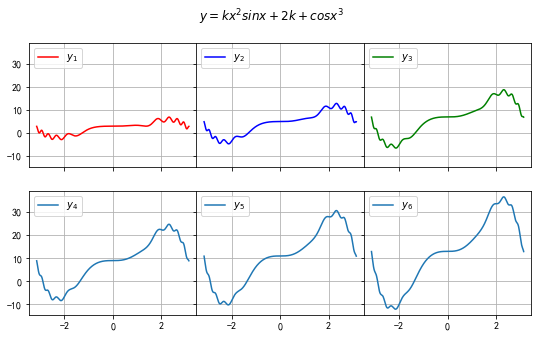

In [6]:
x = np.linspace(-np.pi, np.pi, 600)
#颜色
colors = ['r', 'b', 'g', 'y', 'm', 'c']
#创建画布
fig, ax = plt.subplots(nrows=2, ncols=3, sharex='all', sharey='all', figsize=(9, 5))
plt.subplots_adjust(wspace=0)    #间距
i = 0
#迭代画图
for k in range(1, 7):
    y = k*x**2*np.sin(x)+2*k+np.cos(x**3)
    if i < 3:
        ax[0, i].plot(x, y, label='$y_{%d}$'%k, color=colors[k-1])
        ax[0, i].legend(loc='upper left')
        ax[0, i].grid()
    else:
        ax[1, i%3].plot(x, y, label='$y_{%d}$'%k)
        ax[1, i%3].legend(loc='upper left')
        ax[1, i%3].grid()
    i += 1
#设置总标题
plt.suptitle('$y = kx^2sinx + 2k + cosx^3$')
plt.show()

#### 单叶双曲面

$ \frac{x^2}{8}+\frac{y^2}{10}-\frac{z^2}{6}=1 $

一般形式: 
$$ \frac{x^2}{a^2}+\frac{y^2}{b^2}-\frac{z^2}{c^2}=1 $$
单叶双曲面参数方程推导:

令$ z = c\cdot tanu $得

$$ \frac{x^2}{a^2}+\frac{y^2}{b^2}=1+tan^2u=sec^2u $$

$$
\Rightarrow \quad \begin{cases}
    x = a\cdot secu\cdot cosv \\
    y = b\cdot secu\cdot sinv \\
    z = c\cdot tanu
\end{cases}
$$

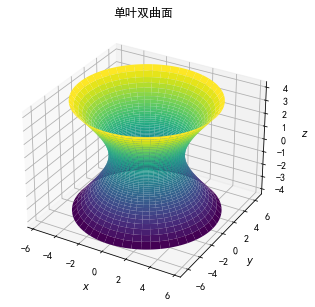

In [7]:
u = np.linspace(-np.pi/3, np.pi/3, 500)
v = np.linspace(0, 2*np.pi, 500)
#网格点
U, V = np.meshgrid(u, v)
#带入参数方程
x = np.sqrt(8)*(1/np.cos(U))*np.cos(V)
y = np.sqrt(10)*(1/np.cos(U))*np.sin(V)
z = np.sqrt(6)*np.tan(U)
#绘图
fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, z, cmap='viridis')
ax.set_title('单叶双曲面')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')
ax.set_aspect(aspect='auto')
plt.show()

#### 双叶双曲面

$ \frac{x^2}{8}-\frac{y^2}{12}-\frac{z^2}{8}=1 $

一般形式:

$$ \frac{x^2}{a^2}-\frac{y^2}{b^2}-\frac{z^2}{c^2}=1 $$

双叶双曲面参数方程推导:

令$ x=a\cdot secu $得:

$$
\Rightarrow \quad
\begin{cases}
    x = a\cdot secu \\
    y = b\cdot tanu\cdot cosv \\
    z = c\cdot tanu\cdot sinv
\end{cases}
$$

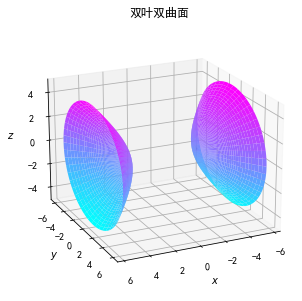

In [8]:
#设置两个子叶数据
u1 = np.linspace(0, np.pi/3, 500)
u2 = np.linspace(2*np.pi/3, np.pi, 500)
v = np.linspace(0, 2*np.pi, 500)
#网格点
U1, V = np.meshgrid(u1, v)
U2, V = np.meshgrid(u2, v)
#第一个子叶
x1 = np.sqrt(8)*(1/np.cos(U1))
y1 = np.sqrt(12)*np.tan(U1)*np.cos(V)
z1 = np.sqrt(8)*np.tan(U1)*np.sin(V)
#第二个子叶
x2 = np.sqrt(8)*(1/np.cos(U2))
y2 = np.sqrt(12)*np.tan(U2)*np.cos(V)
z2 = np.sqrt(8)*np.tan(U2)*np.sin(V)
#绘图
fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x1, y1, z1, cmap='cool')
ax.plot_surface(x2, y2, z2, cmap='cool')
#设置图片细节
ax.set_title('双叶双曲面')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')
#调整参数
ax.view_init(elev=20, azim=65)
plt.show()

#### 椭圆抛物面

$ \frac{x^2}{10}+\frac{y^2}{6}=z $ 

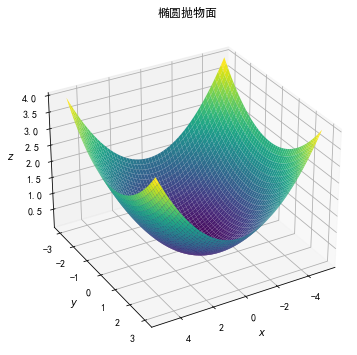

In [9]:
#数据点
x = np.linspace(-5, 5, 500)
y = np.linspace(-3, 3, 500)
X, Y = np.meshgrid(x, y)
Z = X**2/10 + Y**2/6
#创建画布
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis')
#设置细节
ax.set_title(r'椭圆抛物面')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_zlabel('$z$')
#调整视角
ax.view_init(elev=30, azim=60)
plt.show()